In [1]:
import os
from tqdm import tqdm

import numpy as np
import pandas as pd

import PIL
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

import sys

device = torch.device("cuda") 

## Requirement
Install base StarGAN here: https://github.com/yunjey/stargan.git

In [38]:
from torch.autograd import Variable
from torchvision.utils import save_image
import torch
import torch.nn.functional as F
import numpy as np
import os
import time
import datetime

In [2]:
from model import ResidualBlock,Discriminator

In [3]:
class Encoder(nn.Module):
    def __init__(self, conv_dim=64, c_dim=5, repeat_num=6):
        super(Encoder, self).__init__()
        
        self.c_dim = c_dim

        self.input_layer = []
        self.input_layer.append(nn.Conv2d(3+c_dim, conv_dim, kernel_size=7, stride=1, padding=3, bias=False))
        self.input_layer.append(nn.InstanceNorm2d(conv_dim, affine=True, track_running_stats=True))
        self.input_layer.append(nn.ReLU(inplace=True))
        self.input_layer = nn.Sequential(*self.input_layer)
        # Down-sampling layers.
        self.downsampling_block = []
        curr_dim = conv_dim
        for i in range(2):
            self.downsampling_block.append(nn.Conv2d(curr_dim, curr_dim*2, kernel_size=4, stride=2, padding=1, bias=False))
            self.downsampling_block.append(nn.InstanceNorm2d(curr_dim*2, affine=True, track_running_stats=True))
            self.downsampling_block.append(nn.ReLU(inplace=True))
            curr_dim = curr_dim * 2
        self.downsampling_block = nn.Sequential(*self.downsampling_block)

        # Bottleneck layers.
        self.bottleneck_block = []
        for i in range(repeat_num):
            self.bottleneck_block.append(ResidualBlock(dim_in=curr_dim, dim_out=curr_dim))
        self.bottleneck_block = nn.Sequential(*self.bottleneck_block)
        
        self.curr_dim = curr_dim
    def forward(self, x, c=None):
        if c is not None and self.c_dim > 0:
            c = c.view(c.size(0), c.size(1), 1, 1)
            c = c.repeat(1, 1, x.size(2), x.size(3))
            x = torch.cat([x, c], dim=1)
        x = self.input_layer(x)
        x = self.downsampling_block(x)
        x = self.bottleneck_block(x)
        return x
    
    def get_embedding(self, x, c=None):
        emb = self.forward(x, c)
        emb = nn.functional.max_pool2d(emb, kernel_size=2,stride=2)
#         emb = emb.flatten()
#         return emb 
        embeds = [e .flatten() for e in emb]
        embeds = torch.stack(embeds)
        return embeds


class Generator(nn.Module):
    """Generator network."""
    def __init__(self, conv_dim=64, c_dim=5, repeat_num=6):
        super(Generator, self).__init__()

        self.encoder = Encoder(conv_dim=conv_dim, c_dim=c_dim, repeat_num=repeat_num)
        curr_dim = self.encoder.curr_dim
        # Up-sampling layers.
        self.upsampling_block = []
        for i in range(2):
            self.upsampling_block.append(nn.ConvTranspose2d(curr_dim, curr_dim//2, kernel_size=4, stride=2, padding=1, bias=False))
            self.upsampling_block.append(nn.InstanceNorm2d(curr_dim//2, affine=True, track_running_stats=True))
            self.upsampling_block.append(nn.ReLU(inplace=True))
            curr_dim = curr_dim // 2
        self.upsampling_block.append(nn.Conv2d(curr_dim, 3, kernel_size=7, stride=1, padding=3, bias=False))
        self.upsampling_block.append(nn.Tanh())
        self.upsampling_block = nn.Sequential(*self.upsampling_block)
            
    def decode(self, emb):
        x = self.upsampling_block(emb)
        return x
        
    def forward(self, x, c):
        emb_w = self.encoder(x, c)
        out = self.decode(emb_w)
        return out
    
    
class Modifier(nn.Module):
    def __init__(self, conv_dim=64, c_dim=5, repeat_num=6, G_path=None):
        super(Modifier, self).__init__()

        self.generator  = Generator(conv_dim=conv_dim, c_dim=c_dim, repeat_num=repeat_num)
        if G_path is not None:
            #G_path = 'stargan_celeba/models/200000-G.ckpt'
            self.generator.load_state_dict(
                torch.load(G_path, map_location=lambda storage, loc: storage), strict=False)

        self.encoder_id = Encoder(conv_dim=conv_dim, c_dim=0, repeat_num=repeat_num)
    
    def _get_attr(self, x, c):
        emb_w  = self.generator.encoder.get_embedding(x, c)
        emb_id = self.encoder_id.get_embedding(x)
        attr = emb_w - emb_id
        ## you can insert e.g. MLP here attr = MLP(attr)
        return attr
    
    def forward(self, x, c):
        self.generator(x, c)
        

In [4]:
def build_model():
    """Create a the modified generator, and a discriminator."""
    D = Discriminator(128, 64, 5, 6) 
    M = Modifier()
    G = M.generator

    g_optimizer = torch.optim.Adam(G.parameters(),0.0001, [0.5, 0.999])
    d_optimizer = torch.optim.Adam(D.parameters(), 0.0001, [0.5, 0.999])
    m_optimizer = torch.optim.Adam(D.parameters(), 0.0001, [0.5, 0.999])
    G.to(device)
    D.to(device)
    M.to(device)
    return G,D,M,g_optimizer,d_optimizer,m_optimizer

In [5]:
## Modification of base StarGAN helper functions
def create_labels(c_org, c_dim=5, dataset='CelebA', selected_attrs=None):
    """Generate target domain labels for debugging and testing."""
    # Get hair color indices.
    if dataset == 'CelebA':
        hair_color_indices = []
        for i, attr_name in enumerate(selected_attrs):
            if attr_name in ['Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Gray_Hair']:
                hair_color_indices.append(i)
    c_trg_list = []
    for i in range(c_dim):
        if dataset == 'CelebA':
            c_trg = c_org.clone()
            if i in hair_color_indices:  # Set one hair color to 1 and the rest to 0.
                c_trg[:, i] = 1
                for j in hair_color_indices:
                    if j != i:
                        c_trg[:, j] = 0
            else:
                c_trg[:, i] = (c_trg[:, i] == 0)  # Reverse attribute value.
        c_trg_list.append(c_trg.to(device))
    return c_trg_list

def classification_loss(logit, target, dataset='CelebA'):
    """Compute binary or softmax cross entropy loss."""
    return F.binary_cross_entropy_with_logits(logit, target, size_average=False) / logit.size(0)

def gradient_penalty(y, x):
    """Compute gradient penalty: (L2_norm(dy/dx) - 1)**2."""
    weight = torch.ones(y.size()).to(device)
    dydx = torch.autograd.grad(outputs=y,
                               inputs=x,
                               grad_outputs=weight,
                               retain_graph=True,
                               create_graph=True,
                               only_inputs=True)[0]

    dydx = dydx.view(dydx.size(0), -1)
    dydx_l2norm = torch.sqrt(torch.sum(dydx**2, dim=1))
    return torch.mean((dydx_l2norm-1)**2)

def denorm(x):
    """Convert the range from [-1, 1] to [0, 1]."""
    out = (x + 1) / 2
    return out.clamp_(0, 1)

def update_lr(g_lr, d_lr,m_lr,g_optimizer,d_optimizer,m_optimizer):
    """Decay learning rates of the generator and discriminator."""
    for param_group in g_optimizer.param_groups:
        param_group['lr'] = g_lr
    for param_group in d_optimizer.param_groups:
        param_group['lr'] = d_lr
    for param_group in m_optimizer.param_groups:
        param_group['lr'] = m_lr


def train_custom(data_loader,resume_iters=None):
    """Train StarGAN within a single dataset."""
    sample_dir = 'exp_loss/samples'
    model_save_dir = 'exp_loss/models'
    num_iters, num_iters_decay = 200000,100000
    lr_update_step = 1000
    model_save_step = 10000
    attributes_list = ['Black_Hair', 'Blond_Hair', 'Straight_Hair', 'Wavy_Hair', 'Male']
    g_lr,d_lr=0.0001,0.0001
    m_lr = 0.0001
    
    ## Get batch of images from the dataset
    batch_images, batch_labels, batch_attrs = data_loader.get_batch(batch_size=16)
    
    ## Get fixed inputs for debugging.
    x_fixed, c_org = batch_images, torch.FloatTensor(batch_labels)
    x_fixed = x_fixed.to(device)
    c_fixed_list = create_labels(c_org, 5, 'CelebA', attributes_list)

    
    G,D,M,g_optimizer,d_optimizer,m_optimizer = build_model()


    ## Start training from scratch or resume training.
    start_iters = 0
    
    ## Load a checkpoint if resume training
    if resume_iters:
        start_iters = resume_iters
        G_path = os.path.join(model_save_dir, '{}-G.ckpt'.format(resume_iters))
        D_path = os.path.join(model_save_dir, '{}-D.ckpt'.format(resume_iters))
        M_path = os.path.join(model_save_dir, '{}-M.ckpt'.format(resume_iters))
        G.load_state_dict(torch.load(G_path, map_location=lambda storage, loc: storage))
        D.load_state_dict(torch.load(D_path, map_location=lambda storage, loc: storage))    
        M.load_state_dict(torch.load(M_path, map_location=lambda storage, loc: storage)) 

    # Start training.
    print('Start training...')
    start_time = time.time()
    for i in range(start_iters, 200000):

        # =================================================================================== #
        #                             1. Preprocess input data                                #
        # =================================================================================== #

        ## Get real images and labels.
        try:
            batch_images, batch_labels, batch_attrs = data_loader.get_batch(batch_size=16)
            x_real, label_org = batch_images, torch.FloatTensor(batch_labels)
        except:
            batch_images, batch_labels, batch_attrs = data_loader.get_batch(batch_size=16,refresh=True)
            x_real, label_org = batch_images, torch.FloatTensor(batch_labels)

        ## Generate target domain labels randomly.
        rand_idx = torch.randperm(label_org.size(0))
        label_trg = label_org[rand_idx]

        c_org = label_org.clone()
        c_trg = label_trg.clone()

        x_real = x_real.to(device)           # Input images.
        c_org = c_org.to(device)             # Original domain labels.
        c_trg = c_trg.to(device)             # Target domain labels.
        label_org = label_org.to(device)     # Labels for computing classification loss.
        label_trg = label_trg.to(device)     # Labels for computing classification loss.

        # =================================================================================== #
        #                             2. Train the discriminator                              #
        # =================================================================================== #

        # Compute loss with real images.
        out_src, out_cls = D(x_real)
        d_loss_real = - torch.mean(out_src)
        d_loss_cls = classification_loss(out_cls, label_org, 'CelebA')

        # Compute loss with fake images.
        x_fake = G(x_real, c_trg)
        out_src, out_cls = D(x_fake.detach())
        d_loss_fake = torch.mean(out_src)

        # Compute loss for gradient penalty.
        alpha = torch.rand(x_real.size(0), 1, 1, 1).to(device)
        x_hat = (alpha * x_real.data + (1 - alpha) * x_fake.data).requires_grad_(True)
        out_src, _ = D(x_hat)
        d_loss_gp = gradient_penalty(out_src, x_hat)

        # Backward and optimize.
        d_loss = d_loss_real + d_loss_fake + 1 * d_loss_cls + 10 * d_loss_gp
        g_optimizer.zero_grad() #self.reset_grad()
        d_optimizer.zero_grad()
        
        d_loss.backward()
        d_optimizer.step()

        # Logging.
        loss = {}
        loss['D/loss_real'] = d_loss_real.item()
        loss['D/loss_fake'] = d_loss_fake.item()
        loss['D/loss_cls'] = d_loss_cls.item()
        loss['D/loss_gp'] = d_loss_gp.item()

        # =================================================================================== #
        #                               3. Train the generator + modifier                     #
        # =================================================================================== #
        
        ## Get batch of images that are different but have the same attribute 
        batch_images, batch_labels, batch_attr = data_loader.get_positive_pairs(batch_size=16)
        x1,x2 = batch_images[0], batch_images[1]
        c_compare = torch.FloatTensor(batch_labels)
        x1,x2 = x1.to(device),x2.to(device)
        c_compare = c_compare.to(device)
        
        ## Get the attribute representation of two those two image batches
        embed1 = M._get_attr(x1,c_compare)
        embed2 = M._get_attr(x2,c_compare)
        
        ## Compute similarity matrix
        sim_matrix =  nn.functional.normalize(embed1)@ nn.functional.normalize(embed2).T
        
        ## Computer infoNCE loss
        infonce_loss = torch.diag(nn.functional.log_softmax(sim_matrix)).mean()
        m_optimizer.zero_grad()
        infonce_loss.backward()
        m_optimizer.step()
        loss['M/infonce_loss'] = infonce_loss.item()

        
        
        if (i+1) % 5 == 0:
            ## inofnce loss
            batch_images, batch_labels, batch_attr = data_loader.get_positive_pairs(batch_size=16)
            x1,x2 = batch_images[0], batch_images[1]
            c_compare = torch.FloatTensor(batch_labels)
            x1,x2 = x1.to(device),x2.to(device)
            c_compare = c_compare.to(device)
            embed1 = M._get_attr(x1,c_compare)
            embed2 = M._get_attr(x2,c_compare)
            sim_matrix =  nn.functional.normalize(embed1)@ nn.functional.normalize(embed2).T
            g_infonce_loss = torch.diag(nn.functional.log_softmax(sim_matrix)).mean()
            
            # Original-to-target domain.
            x_fake = G(x_real, c_trg)
            out_src, out_cls = D(x_fake)
            g_loss_fake = - torch.mean(out_src)
            g_loss_cls = classification_loss(out_cls, label_trg, 'CelebA')

            # Target-to-original domain.
            x_reconst = G(x_fake, c_org)
            g_loss_rec = torch.mean(torch.abs(x_real - x_reconst))

            # Backward and optimize. uncomment the line below for og
            g_loss = g_loss_fake + 10 * g_loss_rec + 1 * g_loss_cls + 0.1*g_infonce_loss
            g_optimizer.zero_grad() #self.reset_grad()
            d_optimizer.zero_grad()
            g_loss.backward()
            g_optimizer.step()

            # Logging.
            loss['G/loss_fake'] = g_loss_fake.item()
            loss['G/loss_rec'] = g_loss_rec.item()
            loss['G/loss_cls'] = g_loss_cls.item()

        # =================================================================================== #
        #                                 4. Miscellaneous                                    #
        # =================================================================================== #

        # Print out training information.
        if (i+1) % 10 == 0:
            et = time.time() - start_time
            et = str(datetime.timedelta(seconds=et))[:-7]
            log = "Elapsed [{}], Iteration [{}/{}]".format(et, i+1, 200000)
            for tag, value in loss.items():
                log += ", {}: {:.4f}".format(tag, value)
            print(log)

        # Translate fixed images for debugging.
        if (i+1) % 1000 == 0:
            with torch.no_grad():
                x_fake_list = [x_fixed]
                for c_fixed in c_fixed_list:
                    x_fake_list.append(G(x_fixed, c_fixed))
                x_concat = torch.cat(x_fake_list, dim=3)
                sample_path = os.path.join(sample_dir, '{}-images.jpg'.format(i+1))
                save_image(denorm(x_concat.data.cpu()), sample_path, nrow=1, padding=0)
                print('Saved real and fake images into {}...'.format(sample_path))

        # Save model checkpoints.
        if (i+1) % model_save_step == 0:
            G_path = os.path.join(model_save_dir, '{}-G.ckpt'.format(i+1))
            D_path = os.path.join(model_save_dir, '{}-D.ckpt'.format(i+1))
            M_path = os.path.join(model_save_dir, '{}-M.ckpt'.format(i+1))
            torch.save(G.state_dict(), G_path)
            torch.save(D.state_dict(), D_path)
            torch.save(M.state_dict(), M_path)
            print('Saved model checkpoints into {}...'.format(model_save_dir))

        # Decay learning rates.
        if (i+1) % lr_update_step == 0 and (i+1) > (num_iters - num_iters_decay):
            g_lr -= (g_lr / float(num_iters_decay))
            d_lr -= (d_lr / float(num_iters_decay))
            m_lr -= (m_lr / float(num_iters_decay))
            update_lr(g_lr, d_lr,m_lr,g_optimizer,d_optimizer,m_optimizer)
            print ('Decayed learning rates, g_lr: {}, d_lr: {}, m_lr: {}.'.format(g_lr, d_lr,m_lr))


In [16]:
from data_loader import *
## Suppose the dataset path is data/celeba/images
dataset = get_loader('data/celeba/images', 'data/celeba/list_attr_celeba.txt', ['Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Male', 'Young'],
                                   178, 128, 16,
                                   'CelebA', 'train', 1).dataset
import sys

pathdir = '/projectnb/cs585bp/choi_project/project_meeting_notes/'
sys.path.insert(1, pathdir)

from customDataLoader import * 
attribute_keys = ['Black_Hair', 'Blond_Hair', 'Straight_Hair', 'Wavy_Hair', 'Male']

### Load the data
data_loader = DataLoader(
    dataset_path       = '/projectnb/cs585bp/585-Project-nguymi01/data/',
    image_path         = '/projectnb/cs585bp/585-Project-nguymi01/data/img_align_celeba/img_align_celeba/',
    attr_data_filename = 'list_attr_celeba.csv',
    part_data_filename = 'list_eval_partition.csv',
    attribute_keys     = attribute_keys,           ## None if you want use all attributes
    ignore_partition   = False,                   ## False to use train set only
    pretrained_embeddings_filename = None,        ## N/A for StarGAN and AttrGAN
    image_transform    = dataset.transform         ## image input preprecessing transformation.
)

Finished preprocessing the CelebA dataset...


In [45]:
import warnings
warnings.filterwarnings('ignore')
train_custom(data_loader)

/share/pkg.7/python3/3.8.10/install/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Start training...
Elapsed [0:00:08], Iteration [10/200000], D/loss_real: -20.6778, D/loss_fake: 11.5346, D/loss_cls: 5.5954, D/loss_gp: 0.0426, M/infonce_loss: -2.7799, G/loss_fake: -8.1342, G/loss_rec: 0.5099, G/loss_cls: 2.6411
Elapsed [0:00:16], Iteration [20/200000], D/loss_real: -19.1647, D/loss_fake: -9.1806, D/loss_cls: 2.6710, D/loss_gp: 0.7694, M/infonce_loss: -2.7518, G/loss_fake: 22.7243, G/loss_rec: 0.4649, G/loss_cls: 2.9582
Elapsed [0:00:25], Iteration [30/200000], D/loss_real: -30.5781, D/loss_fake: 0.4945, D/loss_cls: 3.7386, D/loss_gp: 0.5504, M/infonce_loss: -2.7682, G/loss_fake: -2.1384, G/loss_rec: 0.4440, G/loss_cls: 3.7564
Elapsed [0:00:33], Iteration [40/200000], D/loss_real: -29.3888, D/loss_fake: 9.4127, D/loss_cls: 3.5146, D/loss_gp: 0.2891, M/infonce_loss: -2.7702, G/loss_fake: -4.9045, G/loss_rec: 0.4394, G/loss_cls: 4.3278
Elapsed [0:00:42], Iteration [50/200000], D/loss_real: -17.8845, D/loss_fake: 11.7783, D/loss_cls: 4.5278, D/loss_gp: 0.0632, M/infonce_

NameError: name 'g_optimizer' is not defined

In [50]:
train_custom(data_loader,resume_iters=100000)

Start training...
Elapsed [0:00:02], Iteration [100010/200000], D/loss_real: -1.0475, D/loss_fake: 0.0755, D/loss_cls: 1.0564, D/loss_gp: 0.0043, M/infonce_loss: -2.7298, G/loss_fake: -0.0586, G/loss_rec: 0.1090, G/loss_cls: 0.4606
Elapsed [0:00:04], Iteration [100020/200000], D/loss_real: -1.9051, D/loss_fake: 0.8151, D/loss_cls: 1.2016, D/loss_gp: 0.0066, M/infonce_loss: -2.7475, G/loss_fake: -0.7525, G/loss_rec: 0.0863, G/loss_cls: 0.4293
Elapsed [0:00:06], Iteration [100030/200000], D/loss_real: -2.0460, D/loss_fake: 1.5610, D/loss_cls: 0.8772, D/loss_gp: 0.0056, M/infonce_loss: -2.7388, G/loss_fake: -0.9065, G/loss_rec: 0.0834, G/loss_cls: 0.4966
Elapsed [0:00:09], Iteration [100040/200000], D/loss_real: -1.0617, D/loss_fake: 0.0768, D/loss_cls: 1.2287, D/loss_gp: 0.0081, M/infonce_loss: -2.7305, G/loss_fake: 0.1769, G/loss_rec: 0.0791, G/loss_cls: 0.4884
Elapsed [0:00:11], Iteration [100050/200000], D/loss_real: -2.3089, D/loss_fake: 1.1789, D/loss_cls: 0.9907, D/loss_gp: 0.0047,

In [58]:
## Get batches of images from the dataset
def get_batch(data_loader, batch_size, refresh=False, permutate=True, with_pretrained_embeddings=False):
    if refresh or data_loader.state['queue'] is None:
        if with_pretrained_embeddings:
            data_loader.state['queue'] = np.arange(data_loader.pretrained_embedings.shape[0])
        elif data_loader.state['partition'] == -1:
            data_loader.state['queue'] = np.array(list(data_loader.attr_data.index))
        else:
            data_loader.state['queue'] = np.array(list(data_loader.get_partition(data_loader.state['partition']).index))
        if permutate:
            data_loader.state['queue'] = np.random.permutation(data_loader.state['queue'])

    elif data_loader.state['queue'] is not None and len(data_loader.state['queue']) < batch_size:
        data_loader.state['current'] = None
        data_loader.state['queue'] = None
        return None, None, None


    data_loader.state['current'], data_loader.state['queue'] = data_loader.state['queue'][:batch_size], data_loader.state['queue'][batch_size:]
    batch_inds = data_loader.state['current']
    batch_attr = data_loader.attr_data.loc[batch_inds]
    batch_images = load_image_batch(batch_attr.image_id.values,
                                    dataset_path=data_loader.image_path,
                                    transform=data_loader.image_transform,
                                    batch_size=batch_size)
    batch_labels = batch_attr[data_loader.keys].values == 1

    if with_pretrained_embeddings:
        batch_embs = data_loader.pretrained_embedings[batch_inds]
        return batch_images, batch_labels, batch_embs
    return batch_images, batch_labels, batch_attr

In [281]:
def test(data_loader,resume_iters=200000):
    """Translate images using StarGAN trained on a single dataset."""
    ## Load the trained model.
    G,D,M,g_optimizer,d_optimizer,m_optimizer = build_model()
    sample_dir = 'exp_loss/samples'
    model_save_dir = 'exp_loss/models'
    result_dir = 'exp_loss/results'
    total_iters = int(200000/16)
    attributes_list = ['Black_Hair', 'Blond_Hair', 'Straight_Hair', 'Wavy_Hair', 'Male']
    ## Start training from scratch or resume training.
    start_iters = 0
    if resume_iters:
        G_path = os.path.join(model_save_dir, '{}-G.ckpt'.format(resume_iters))
        D_path = os.path.join(model_save_dir, '{}-D.ckpt'.format(resume_iters))
        M_path = os.path.join(model_save_dir, '{}-M.ckpt'.format(resume_iters))
        G.load_state_dict(torch.load(G_path, map_location=lambda storage, loc: storage))
        D.load_state_dict(torch.load(D_path, map_location=lambda storage, loc: storage))    
        M.load_state_dict(torch.load(M_path, map_location=lambda storage, loc: storage))     
    with torch.no_grad():
        for i in range(int(total_iters/100)): 
            if(i==0):
                batch_images, batch_labels, batch_attrs = get_batch(data_loader,batch_size=1,permutate=False,refresh=True)
                print(data_loader.state)
            else:
                batch_images, batch_labels, batch_attrs = get_batch(data_loader,batch_size=1,permutate=False)
            x_real, c_org = batch_images, torch.FloatTensor(batch_labels)
            ## Prepare input images and target domain labels.
            x_real = x_real.to(device)
            c_trg_list = create_labels(c_org, 5, 'CelebA', attributes_list)
            ## Translate images.
            x_fake_list = [x_real]
            for c_trg in c_trg_list:
                x_fake_list.append(G(x_real, c_trg))
            ## Save the translated images.
            x_concat = torch.cat(x_fake_list, dim=3)
            result_path = os.path.join(result_dir, '{}-images.jpg'.format(i+1))
            save_image(denorm(x_concat.data.cpu()), result_path, nrow=1, padding=0)
            print('Saved real and fake images into {}...'.format(result_path))

## Testing structure

In [282]:
from data_loader import *
dataset = get_loader('data/celeba/images', 'data/celeba/list_attr_celeba.txt', ['Black_Hair', 'Blond_Hair', 'Straight_Hair', 'Wavy_Hair', 'Male'],
                                   178, 128, 1,
                                   'CelebA', 'test', 1,).dataset
import sys
## Change the dataset path
pathdir = '/projectnb/cs585bp/choi_project/project_meeting_notes/'
sys.path.insert(1, pathdir)

from customDataLoader import * 
attribute_keys = ['Black_Hair', 'Blond_Hair', 'Straight_Hair', 'Wavy_Hair', 'Male']


data_loader = DataLoader(
    dataset_path       = '/projectnb/cs585bp/585-Project-nguymi01/data/',
    image_path         = '/projectnb/cs585bp/585-Project-nguymi01/data/img_align_celeba/img_align_celeba/',
    attr_data_filename = 'list_attr_celeba.csv',
    part_data_filename = 'list_eval_partition.csv',
    attribute_keys     = attribute_keys,           ## None if you want use all attributes
    ignore_partition   = True,                   ## False to use train set only
    pretrained_embeddings_filename = None,        ## N/A for StarGAN and AttrGAN
    image_transform    = dataset.transform         ## image input preprecessing transformation.
)

Finished preprocessing the CelebA dataset...


In [283]:
data_loader.state['partition'] = 2 ## set the partition mode to be test

In [285]:
## Test the model
test(data_loader)

{'partition': 2, 'queue': array([182638, 182639, 182640, ..., 202596, 202597, 202598]), 'current': array([182637])}
Saved real and fake images into exp_loss/results/1-images.jpg...
Saved real and fake images into exp_loss/results/2-images.jpg...
Saved real and fake images into exp_loss/results/3-images.jpg...
Saved real and fake images into exp_loss/results/4-images.jpg...
Saved real and fake images into exp_loss/results/5-images.jpg...
Saved real and fake images into exp_loss/results/6-images.jpg...
Saved real and fake images into exp_loss/results/7-images.jpg...
Saved real and fake images into exp_loss/results/8-images.jpg...
Saved real and fake images into exp_loss/results/9-images.jpg...
Saved real and fake images into exp_loss/results/10-images.jpg...
Saved real and fake images into exp_loss/results/11-images.jpg...
Saved real and fake images into exp_loss/results/12-images.jpg...
Saved real and fake images into exp_loss/results/13-images.jpg...
Saved real and fake images into exp

In [234]:
## Compute classification accuracy and F1 score of the discriminator
def clsc(data_loader,mode='new'):
    if mode=='new':
        model_save_dir = 'exp_loss/models'
    else:
        model_save_dir = 'exp/models'
    ## Load the discriminator model
    total_iters = 5000
    resume_iters = 200000
    D_path = os.path.join(model_save_dir, '{}-D.ckpt'.format(resume_iters))
    D.load_state_dict(torch.load(D_path, map_location=lambda storage, loc: storage))   
    
    predicted_list = []
    real_list = []
    with torch.no_grad():
        for i in range(int(total_iters)):
            if(i==0):
                x_real, batch_labels, batch_attrs = get_batch(data_loader,batch_size=1,permutate=False,refresh=True)
            else:
                x_real, batch_labels, batch_attrs = get_batch(data_loader,batch_size=1,permutate=False)
            x_real = x_real.to(device)
            out_src, out_cls = D(x_real)
            ## Convert the prediction of the discriminator to be either 0 or 1
            out_cls[out_cls<0] = 0
            out_cls[out_cls>0] = 1
            
            out_cls=out_cls.cpu()
            predicted = out_cls.numpy()[0]
    
            real_lables = torch.FloatTensor(batch_labels).numpy()[0]
            predicted_list.append(predicted)
            real_list.append(real_lables)
            ## After the loop, we will get a list of predicted attributes based on the input images 
            ## and a list of real attributes of those images.
    acc = accuracy_score(predicted_list, real_list)
    f1 = f1_score(predicted_list, real_list,  average='weighted')
    print('Accuracy score ', acc)
    print('F1 score ', f1)
    return acc,f1
    
    

In [235]:
clsc(data_loader,mode='old')

Accuracy score  0.5438
F1 score  0.8073495395390407


(0.5438, 0.8073495395390407)

In [236]:
clsc(data_loader,mode='new')

Accuracy score  0.5148
F1 score  0.7823239407626985


(0.5148, 0.7823239407626985)

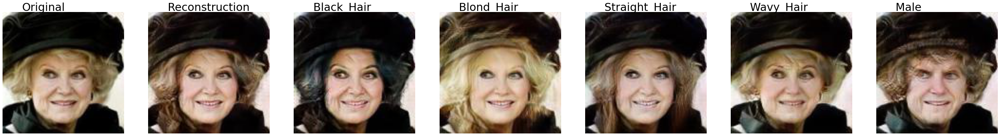

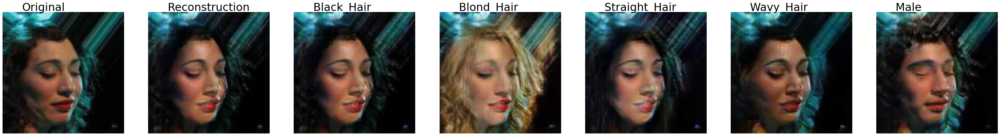

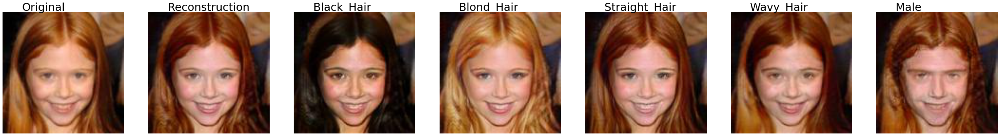

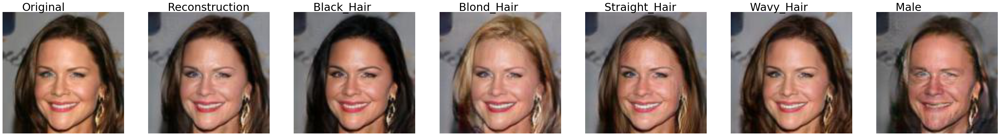

In [2]:

from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
def display(real_path='real_crop/',result_path = 'exp_loss/results/'):
    test_keys = ['Reconstruction','Black_Hair', 'Blond_Hair', 'Straight_Hair', 'Wavy_Hair', 'Male']
    test_image_fnames = ['182638.jpg', '182639.jpg', '182640.jpg', '182641.jpg']
    img = []
    for row in range(4):
        og_img = np.asarray(Image.open(real_path+str(row+1)+'-images.jpg'))
        path = result_path+str(row+1)+'-images.jpg'
        six_faces_fake = np.asarray(Image.open(path))
        _ = six_faces_fake.reshape((128, 6, 128, 3)).transpose(1,0,2,3)
        img.append(_)
        fig,ax = plt.subplots(1, 7, figsize=(49, 7))
        ax[0].imshow(og_img)
        ax[0].set_axis_off()
        ax[0].text(20,-2, 'Original',
            fontsize = 30)
        for i in range(_.shape[0]):
            ax[i+1].imshow(_[i])
            ax[i+1].set_axis_off()
            ax[i+1].text(20,-2, test_keys[i],
            fontsize = 30)
    plt.savefig('infonce_results.png')
    plt.show()
display()
# img = np.hstack(img)

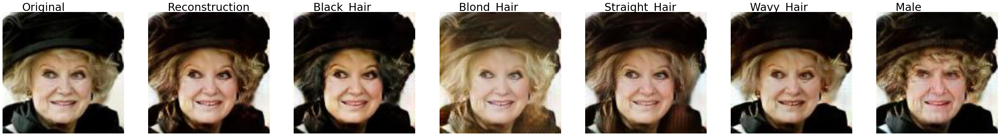

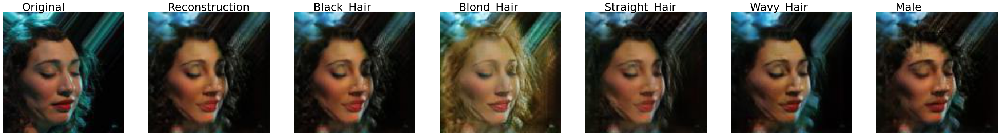

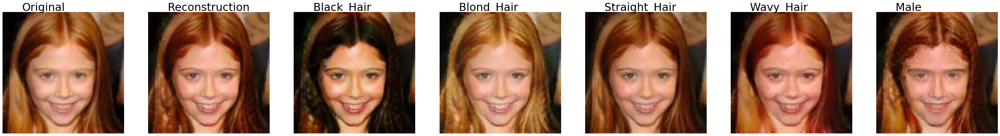

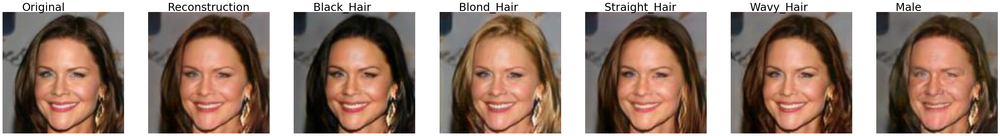

In [3]:
display(result_path='exp/results/')